## Udacity Self-Driving Car Nanodegree

### Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


In [1828]:
import numpy as np
import cv2
import pickle
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from ipywidgets import interact, interactive, fixed
from moviepy.editor import VideoFileClip
from IPython.display import HTML
import os

%matplotlib inline

print("Imports .....")

Imports .....


### 1. Camera Callibration

#### 1a.  Compute the camera calibration matrix and distortion coefficients given a set of chessboard images

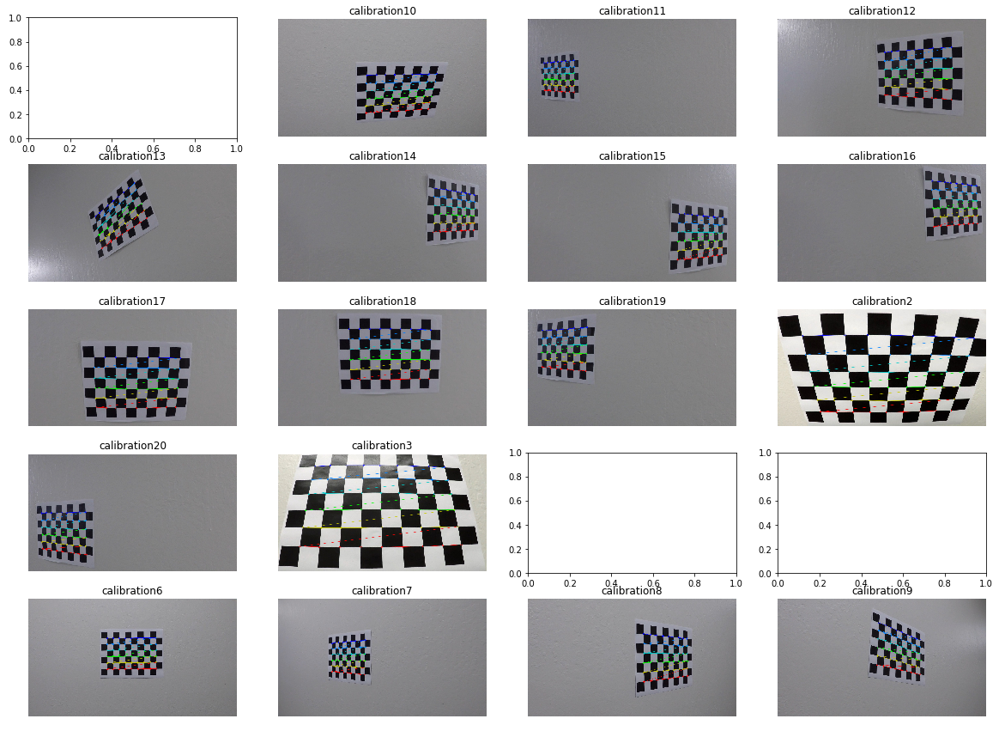

In [1829]:
# Read in the calibration images
images = glob.glob('camera_cal/calibration*.jpg')

f, axs = plt.subplots(5,4, figsize=(20, 15))
axs = axs.ravel()

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Prepare object points like (0,0,0), (1,0,0), (2,0,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2) # x,y coordinates

for i, fname in enumerate(images):
    # read in each image
    img = mpimg.imread(fname) 
    #convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        #draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6),corners,ret)
        axs[i].axis('off')
        file_name = os.path.splitext(os.path.basename(fname))[0]        
        axs[i].set_title(file_name)
        axs[i].imshow(img)
        
    

#### 2a. Apply a distortion correction to raw images.

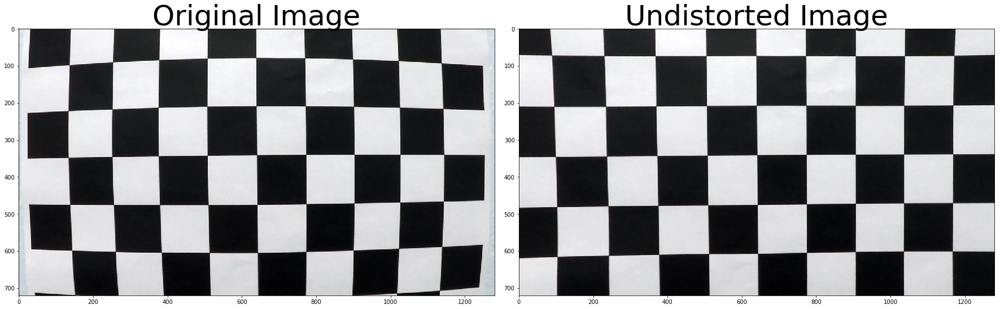

In [1830]:
# performs the camera calibration, image distortion correction and 
# returns the undistorted image
img  = cv2.imread('camera_cal/calibration1.jpg')
def cal_undistort(img, objpoints, imgpoints):
    # Use cv2.calibrateCamera and cv2.undistort()
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist, mtx, dist

undistorted, mtx, dist = cal_undistort(img, objpoints, imgpoints)

# save the mtx and dist coefficients
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump(dist_pickle, open("calibration.p", "wb"))

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## 2. Pipeline (test images)

### 2a.  Provide an example of a distortion-corrected image.

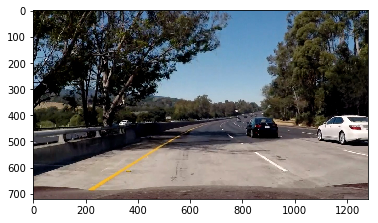

In [1831]:
#An example of a distortion corrected image
testImg = cv2.imread('test_images/test5.jpg')
testImg = cv2.cvtColor(testImg, cv2.COLOR_BGR2RGB)
plt.imshow(testImg)

In [1832]:
# undistort the image
def undistort(img):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

#### Visualize undistorted image

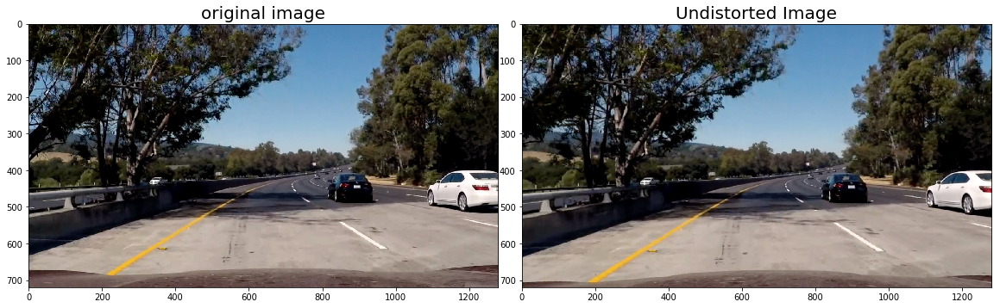

In [1833]:
undist = undistort(testImg)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.set_title("original image", fontsize=20)
ax1.imshow(testImg)
ax2.set_title("Undistorted Image", fontsize=20)
ax2.imshow(undist)

### 2b. Describe how (and identify where in your code) you used color transforms, gradients or other methods to create a thresholded binary image. Provide an example of a binary image result.

#### Color Transform test image

Text(0.5,1,'LAB B-Channel')

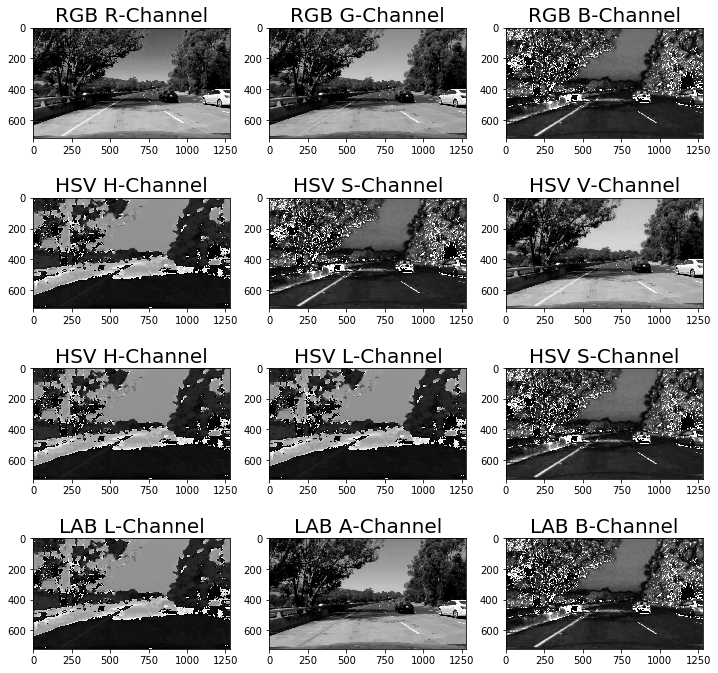

In [1834]:
undist_HSV = cv2.cvtColor(undist, cv2.COLOR_RGB2HSV)
undist_HLS = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)
undist_LAB = cv2.cvtColor(undist, cv2.COLOR_RGB2Lab)



# RGB 
undist_R = undist[:,:,0]
undist_G = undist[:,:,1]
undist_B = undist[:,:,2]

#HSV
undist_H = undist_HSV[:,:,0]
undist_S = undist_HSV[:,:,1]
undist_V = undist_HSV[:,:,2]

#HLS
undist_H = undist_HLS[:,:,0]
undist_L = undist_HLS[:,:,1]
undist_S = undist_HLS[:,:,2]

#LAB
undist_L = undist_HLS[:,:,0]
undist_A = undist_HLS[:,:,1]
undist_B = undist_HLS[:,:,2]

# Visualize the channels
fig, axs = plt.subplots(4,3, figsize=(12, 12))
axs = axs.ravel()
axs[0].imshow(undist_R, cmap = 'gray')
axs[0].set_title('RGB R-Channel', fontsize=20)
axs[1].imshow(undist_G, cmap = 'gray')
axs[1].set_title('RGB G-Channel', fontsize=20)
axs[2].imshow(undist_B, cmap = 'gray')
axs[2].set_title('RGB B-Channel', fontsize=20)

#HSV
axs[3].imshow(undist_H, cmap = 'gray')
axs[3].set_title('HSV H-Channel', fontsize=20)
axs[4].imshow(undist_S, cmap = 'gray')
axs[4].set_title('HSV S-Channel', fontsize=20)
axs[5].imshow(undist_V, cmap = 'gray')
axs[5].set_title('HSV V-Channel', fontsize=20)


#HLS
axs[6].imshow(undist_H, cmap = 'gray')
axs[6].set_title('HSV H-Channel', fontsize=20)
axs[7].imshow(undist_L, cmap = 'gray')
axs[7].set_title('HSV L-Channel', fontsize=20)
axs[8].imshow(undist_S, cmap = 'gray')
axs[8].set_title('HSV S-Channel', fontsize=20)

#LAB
axs[9].imshow(undist_L, cmap = 'gray')
axs[9].set_title('LAB L-Channel', fontsize=20)
axs[10].imshow(undist_A, cmap = 'gray')
axs[10].set_title('LAB A-Channel', fontsize=20)
axs[11].imshow(undist_B, cmap = 'gray')
axs[11].set_title('LAB B-Channel', fontsize=20)



### Gradient Thresholds

#### Visualize  Threshold  results

In [1835]:
# Visualize the results
# Plot the result

def visualize(org_text, final_text, image, bin_image):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title(org_text, fontsize=30)
    ax2.imshow(bin_image, cmap='gray')
    ax2.set_title(final_text, fontsize=30)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

#### 1. Sobel Operator

In [1836]:
def abs_sobel_thresh(img, orient='x', thresh_min=25, thresh_max=255):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

# set the thresholds for sobel and call the function
grad_binary = abs_sobel_thresh(undist,'x', 20, 120)


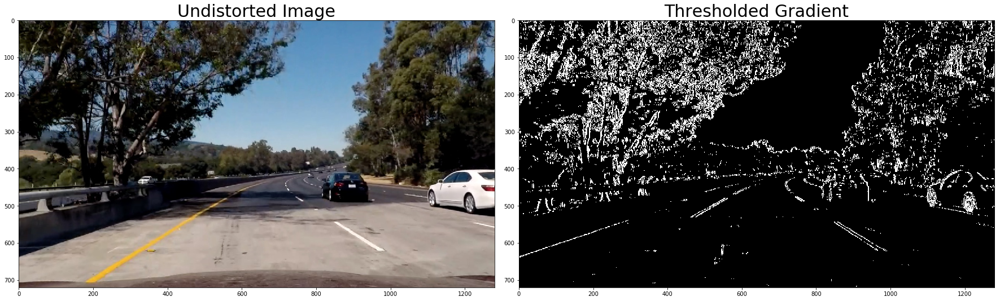

In [1837]:
visualize('Undistorted Image','Thresholded Gradient', undist, grad_binary)

#### 2. Magnitude of the Gradient

In [1838]:
def mag_thresh(img, sobel_kernel=3, mag_thresh=(0, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
     # 3) Calculate the magnitude 
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8)
     # Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

# set the thresholds for Magnitude Threshold and call the function
mag_binary = mag_thresh(undist, 15 ,(20, 120))

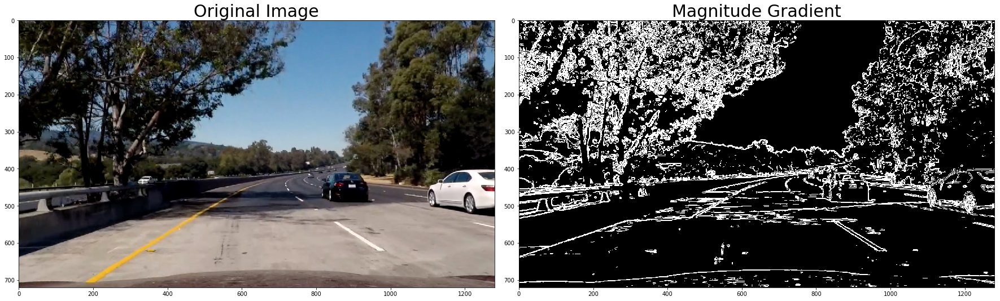

In [1839]:
visualize('Original Image','Magnitude Gradient', undist, mag_binary)

#### 3. Direction of the Gradient

In [1840]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
     # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) 
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    absgraddir = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

# Run the function
dir_binary = dir_threshold(undist, sobel_kernel=15, thresh=(0.7, 1.3))

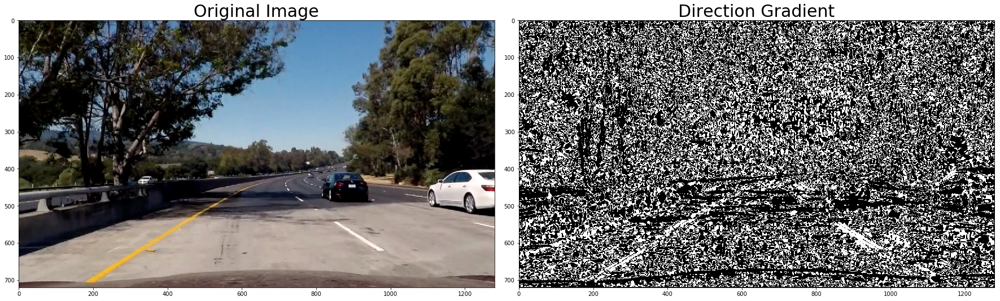

In [1841]:
visualize('Original Image','Direction Gradient', undist, dir_binary)

#### 4. Sobel Magnitude + Direction

In [1842]:
def combined(img):
    s_binary = abs_sobel_thresh(img, 'x', 10, 200)
    
    # apply gradient direction threshold so that only edges closer to vertical are detected.
    dir_binary = dir_threshold(img, thresh=(np.pi/6, np.pi/2))
    
    # combine the gradient and direction thresholds.
    combined = ((s_binary == 1) & (dir_binary == 1))
    return combined

comb_binary = combined(undist)


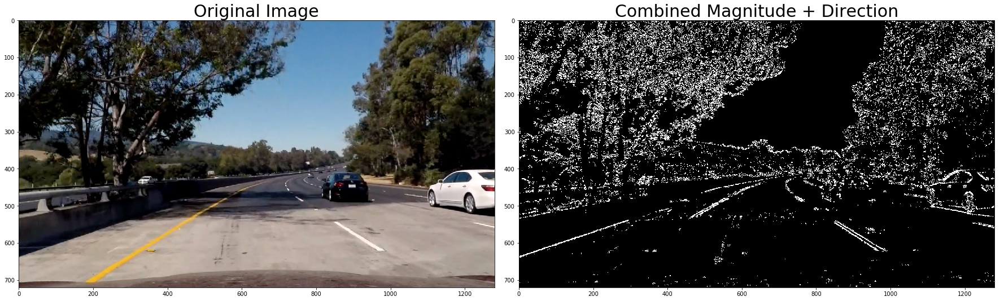

In [1843]:
visualize('Original Image','Combined Magnitude + Direction', undist, comb_binary)

#### 5.  Color Threshold 



#### RG Channel

In [1844]:


# R & G thresholds so that yellow lanes are detected well.

def rgb_thresh(img, thresh=150):
    r_g_condition = (undist_R > thresh) & (undist_G > thresh)

    # Return a binary image of threshold result
    return r_g_condition

rgThresh = rgb_thresh(undist)

...


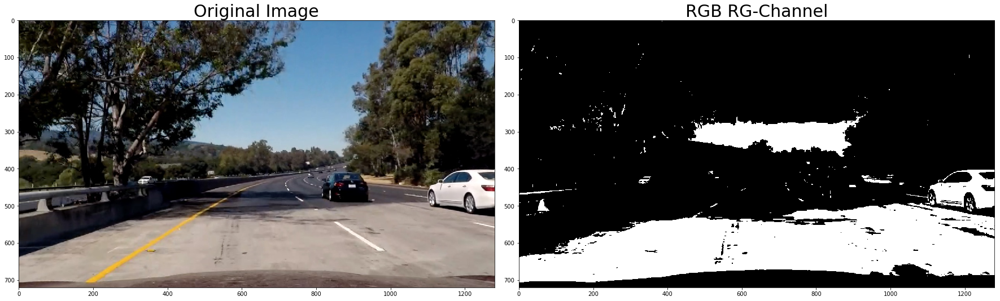

In [1845]:
visualize('Original Image','RGB RG-Channel', undist, rgThresh)
print('...')

#### S, L Channel

In [1846]:
##### S channel performs well for detecting bright yellow and white lanes.
##### We put a threshold on the L channel to avoid pixels which have shadows and as a result darker.


# Define a function that thresholds the S/L-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_sthresh(img, thresh=(125, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_s = hls[:,:,2]
    # threshold to the S channel
    binary_output = np.zeros_like(hls_s)
    S_binary_output = (hls_s > thresh[0]) & (hls_s <= thresh[1])
    return S_binary_output

SThresh = hls_sthresh(undist)


...


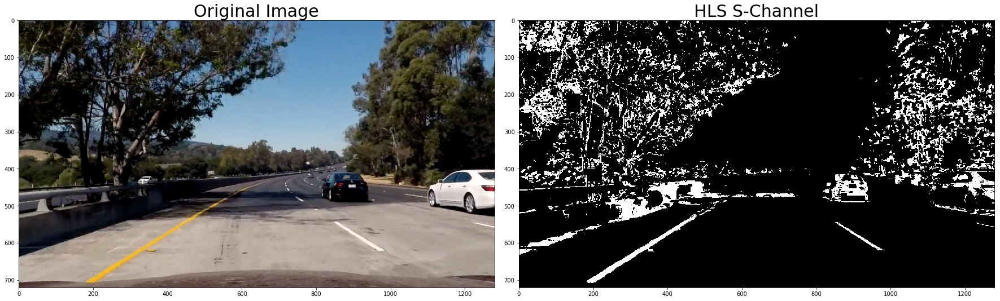

In [1847]:
visualize('Original Image','HLS S-Channel', undist, SThresh)
print('...')

In [1848]:

# Define a function that thresholds the L-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_lthresh(img, thresh=(210, 255)):
    
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_l = hls[:,:,1]
    hls_l = hls_l*(255/np.max(hls_l))
    #threshold to the L channel
    binary_output = np.zeros_like(hls_l)
    binary_output[(hls_l > thresh[0]) & (hls_l <= thresh[1])] = 1
    return binary_output

LThresh = hls_lthresh(undist) 


...


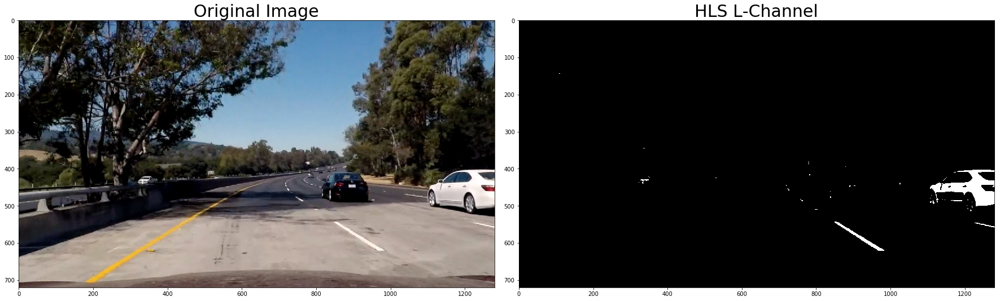

In [1849]:
visualize('Original Image','HLS L-Channel', undist, LThresh)
print('...')

In [1850]:
def lab_bthresh(img, thresh=(190,255)):
    
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    # don't normalize if there are no yellow lines
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    # threshold to the L channel
    binary_output = np.zeros_like(lab_b)
    binary_output[((lab_b > thresh[0]) & (lab_b <= thresh[1]))] = 1
    return binary_output

BThresh = lab_bthresh(undist)

...


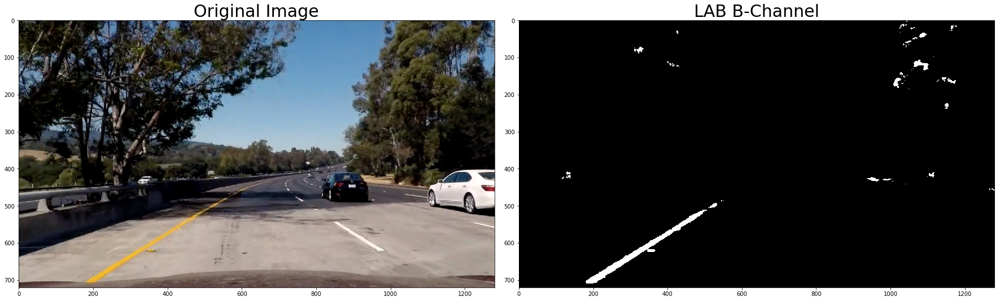

In [1851]:
visualize('Original Image','LAB B-Channel', undist, BThresh)
print('...')

### Pipeline method to create a binary image containing likely lane pixels

In [1852]:
def pipeline(img):
    
    # combine the gradient and direction thresholds.
    comb_binary = combined(img)
    
    r_g_condition = rgb_thresh(img)
   
    s_condition = hls_sthresh(img)
    
    l_condition = hls_lthresh(img)
    
    b_condition = lab_bthresh(img)

    # combine all the thresholds
    color_combined = np.zeros_like(b_condition)
    
    # Combine HLS and Lab B channel thresholds
    color_combined[(l_condition == 1) | (b_condition == 1)] = 1
    #color_combined[(s_condition | l_condition) & (r_g_condition | comb_binary) ] = 1
    
    # apply the region of interest mask as we are not interested in sky and trees
    h, w = gray.shape
    mask = np.zeros_like(color_combined)
    region_of_interest_vertices = np.array([[0,h-1], [w/2, int(0.5*h)], [w-1, h-1]], dtype=np.int32)
    cv2.fillPoly(mask, [region_of_interest_vertices], 1)
    thresholded = cv2.bitwise_and(color_combined, mask)
    
   
    return thresholded

thresholded = pipeline(undist)


...


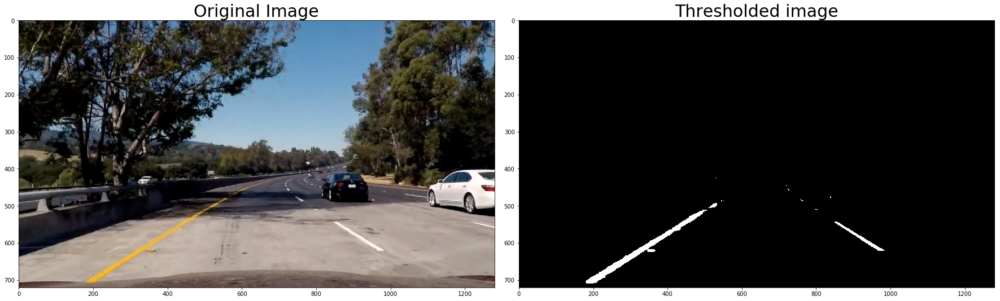

In [1853]:
visualize('Original Image','Thresholded image', undist, thresholded)
print('...')

### 2c. Perspective Transform

#### Describe how (and identify where in your code) you performed a perspective transform and provide an example of a transformed image.

In [1854]:
# unwarp the image using opencv functions
def unwarp(img, src, dst):
    h,w = img.shape[:2]
    # use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    return warped, M, Minv
print('...')

...


In [1855]:
# find the trapezoid co-ordinates on the undistorted image to unwarp the image
h,w = undist.shape[:2]
# define source and destination points for transform
src = np.float32([(582,474),
                  (734,474), 
                  (272,672), 
                  (1082,672)])
dst = np.float32([(450,0),
                  (w-450,0),
                  (450,h),
                  (w-450,h)])

    
unwarp, M, Minv = unwarp(thresholded, src, dst)

Text(0.5,1,'Unwarped Image (S Channel)')

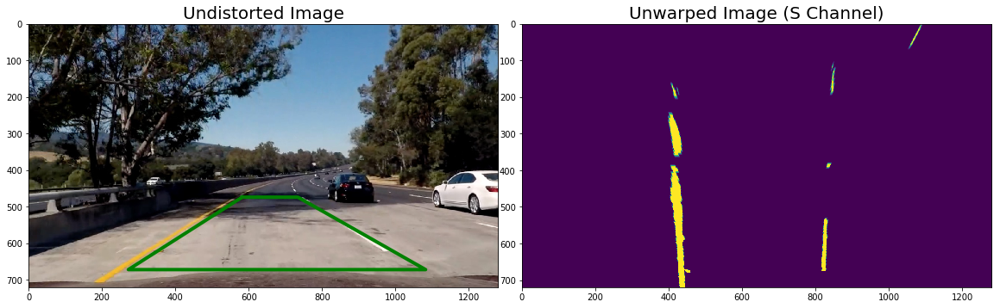

In [1856]:
# Visualize correctly rectified image to a "birds-eye view
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(undist)
ax1.set_ylim([h,0])
ax1.set_xlim([0,w])
x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
ax1.plot(x, y, color='green',linewidth=4)
ax1.set_title('Undistorted Image', fontsize=20)
ax2.imshow(unwarp)
ax2.set_title('Unwarped Image (S Channel)', fontsize=20)

### 2d. Describe how (and identify where in your code) you identified lane-line pixels and fit their positions with a polynomial?

#### Identifying the lane pixels : HISTOGRAM


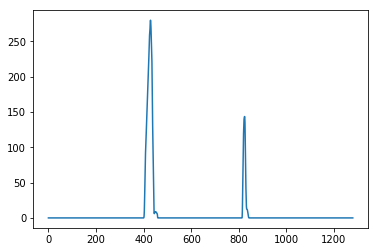

In [1857]:
# Take a histogram of the bottom half of the warped image
histogram = np.sum(unwarp[unwarp.shape[0]//2:,:], axis=0)
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]//2)
quarter_point = np.int(midpoint//2)

leftx_base = np.argmax(histogram[quarter_point:midpoint]) + quarter_point
rightx_base = np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint
plt.plot(histogram)
    

#### Identifying the lane pixels : Sliding Windows and Fit a Polynomial

In [1858]:
def sliding_window_poly_fit(binary_warped):
    #initializing variables

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = undist.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Rectangle data for visualization
    rectangle_data = []
    # Step through the windows one by one
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        #build the rectangle data to be drawn around lane lines
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    left_fit, right_fit = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
        
    return left_fit, right_fit, left_lane_inds, right_lane_inds, rectangle_data
            

(720, 0)

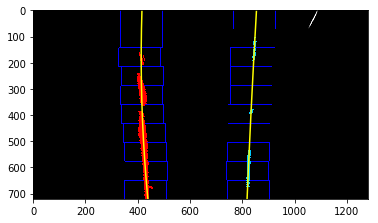

In [1859]:
# visualize the result on example image
left_fit, right_fit, left_lane_inds, right_lane_inds, rectangle_data = sliding_window_polyfit(unwarp)

h = unwarp.shape[0]
#fit a second order polynomial curve:
left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]

rectangles = visualization_data

# Create an output image to draw on and  visualize the result
out_img = np.uint8(np.dstack((unwarp, unwarp, unwarp))*255)
# Generate x and y values for plotting
ploty = np.linspace(0, unwarp.shape[0]-1, unwarp.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

for rect in rectangles:
# Draw the windows on the visualization image
    cv2.rectangle(out_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,0,255), 2) 
    cv2.rectangle(out_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,0,255), 2) 
# Identify the x and y positions of all nonzero pixels in the image
nonzero = unwarp.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 200, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, unwarp.shape[1])
plt.ylim(unwarp.shape[0], 0)



#### Polyfit Using Fit from Previous Frame

In [1860]:
# Define method to fit polynomial to binary image based upon a previous fit 
def ploy_fit_prev_frame(binary_warped, prev_left_fit, prev_right_fit):
    nonzero = unwarp.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80

    new_left_lane_inds = ((nonzerox > (prev_left_fit[0]*(nonzeroy**2) + prev_left_fit[1]*nonzeroy + left_fit_prev[2] - margin)) & 
                      (nonzerox < (prev_left_fit[0]*(nonzeroy**2) + prev_left_fit[1]*nonzeroy + left_fit_prev[2] + margin))) 
    new_right_lane_inds = ((nonzerox > (prev_right_fit[0]*(nonzeroy**2) + prev_right_fit[1]*nonzeroy + right_fit_prev[2] - margin)) & 
                       (nonzerox < (prev_right_fit[0]*(nonzeroy**2) + prev_right_fit[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[new_left_lane_inds]
    lefty = nonzeroy[new_left_lane_inds] 
    rightx = nonzerox[new_right_lane_inds]
    righty = nonzeroy[new_right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
         right_fit_new = np.polyfit(righty, rightx, 2)
    
    return left_fit_new, right_fit_new, new_left_lane_inds, new_right_lane_inds   
    

#### Visualize results

(720, 0)

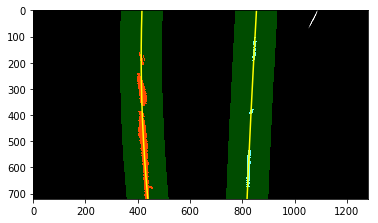

In [1861]:
left_fit_new, right_fit_new, new_left_lane_inds, new_right_lane_inds = ploy_fit_prev_frame(unwarp, left_fit, right_fit)

# Generate x and y values for plotting
ploty = np.linspace(0, unwarp.shape[0]-1, unwarp.shape[0] )
left_fitx = left_fit_prev[0]*ploty**2 + left_fit_prev[1]*ploty + left_fit_prev[2]
right_fitx = right_fit_prev[0]*ploty**2 + right_fit_prev[1]*ploty + right_fit_prev[2]

left_fitx2 = left_fit_new[0]*ploty**2 + left_fit_new[1]*ploty + left_fit_new[2]
right_fitx2 = right_fit_new[0]*ploty**2 + right_fit_new[1]*ploty + right_fit_new[2]


# Create an image to draw on and an image to show the selection window
out_img = np.uint8(np.dstack((unwarp, unwarp, unwarp))*255)
window_img = np.zeros_like(out_img)

# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds_new], nonzerox[left_lane_inds_new]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds_new], nonzerox[right_lane_inds_new]] = [100, 200, 255]

# Generate a polygon to illustrate the search window area 
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx2 - margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx2 + margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx2 - margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx2 + margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx2, ploty, color='yellow')
plt.plot(right_fitx2, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)


### 2e. Describe how (and identify where in your code) you calculated the radius of curvature of the lane and the position of the vehicle with respect to center

In [1878]:
# Determine radius of curvature and distance from lane center 
def radius_of_curvature(binary_warped, left_fit, right_fit, left_lane_inds, right_lane_inds):
    # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    ym_per_pix = 3.048/100 
    # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    xm_per_pix = 3.7/378 
    
    #initialize the left/right curvature and center    
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    
    # Define y-value where we want radius of curvature
    h = binary_warped.shape[0]
    ploty = np.linspace(0, h-1, h) # to cover same y-range as image
    y_eval = np.max(ploty)
    
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = unwarp.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    # Calculate the  radius of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    # Distance from center, image x midpoint - mean of l_fit and r_fit intercepts 
    #assuming the car is at the center of the lane
    car_position = unwarp.shape[1]/2
    l_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
    r_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
    # calculate the lane center
    lane_center_position = (r_fit_x_int + l_fit_x_int) /2
    center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist 


In [1879]:
left_curverad, right_curverad, center_dist = radius_of_curvature(unwarp, left_fit, right_fit, left_lane_inds, right_lane_inds)

print('Radius of curvature for example:', right_curverad, 'm,', left_curverad, 'm')
print('Distance from lane center for example:', center_dist, 'm')

Radius of curvature for example: 4383.16094259 m, 545.928138675 m
Distance from lane center for example: 0.112922593235 m


#### visualize the lane drawn of warped image

In [1881]:

def draw_lane_line(img, binary_warped, left_fit, right_fit):
    new_img = np.copy(img)

    # Create an image to draw the lines on
    unwarp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((unwarp_zero, unwarp_zero, unwarp_zero))
    
    h,w = unwarp.shape
    ploty = np.linspace(0, h-1, num=h)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result



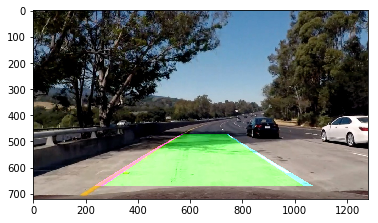

In [1882]:
lane_line_img = draw_lane_line(undist, unwarp, left_fit, right_fit)
plt.imshow(lane_line_img)

#### Draw Curvature Radius and Distance from Center Data onto the Original Image¶


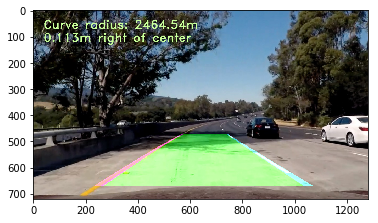

In [1865]:
def write_data(img, curv_rad, center_dist):
    data_img = np.copy(img)
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(data_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(data_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return data_img

    